In [6]:
from xdesign import *
import numpy as np
import matplotlib.pyplot as plt
import multiprocessing
import logging
import pickle
import os

from TextMeWhenDone import textmewhendone

logger = logging.getLogger()
logger.setLevel(logging.INFO)

# Reconstruction comparison

Compare the reconstruction quality for three different acquisition schemes: raster, meta-raster, and random meta-raster.

In [7]:
pixel_fractions = [1.]  # the pixel size compared to the beam width
gap_fractions = [1./8]  # the fraction of space covered by the beam
size = 512
num_stepss = np.array([1, 2, 4, 8, 11, 22, 32]) * 16 #[32, 64, 256, 512]
# num_stepss = np.array([1, 8, 32]) * 16
total_measures = 512 * 11 * 3

In [8]:
total_measures / np.array(num_stepss)

array([ 1056.,   528.,   264.,   132.,    96.,    48.,    33.])

In [9]:
np.random.seed(0)
phantom = DogaCircles(n_sizes=7, size_ratio=10/16, n_shuffles=16)
phantom.radii

array([[ 0.01953,  0.00298,  0.03125,  0.01221,  0.00763,  0.05   ,
         0.00477],
       [ 0.05   ,  0.00763,  0.00298,  0.03125,  0.01953,  0.00477,
         0.01221],
       [ 0.01221,  0.05   ,  0.01953,  0.00763,  0.00477,  0.03125,
         0.00298],
       [ 0.00763,  0.03125,  0.01221,  0.00477,  0.00298,  0.01953,  0.05   ],
       [ 0.00298,  0.01221,  0.00477,  0.05   ,  0.03125,  0.00763,
         0.01953],
       [ 0.03125,  0.00477,  0.05   ,  0.01953,  0.01221,  0.00298,
         0.00763],
       [ 0.00477,  0.01953,  0.00763,  0.00298,  0.05   ,  0.01221,
         0.03125]])

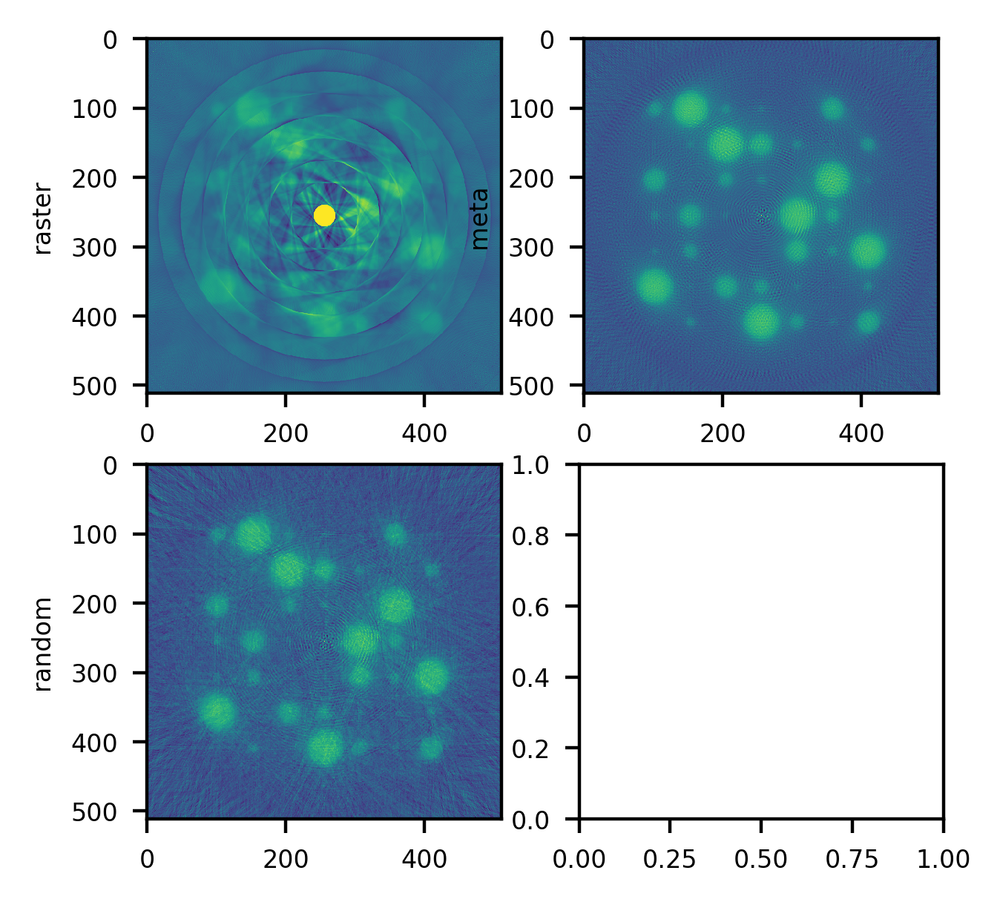

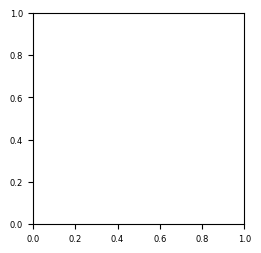

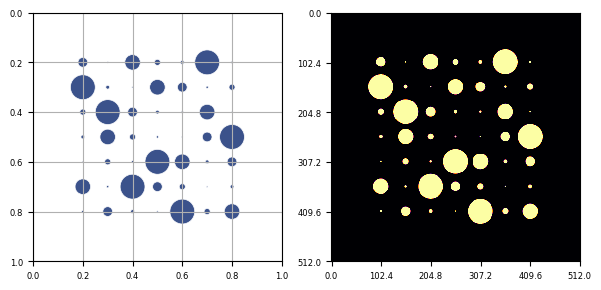

In [10]:
truth = sidebyside(phantom, size)
tif.imsave('./data/doga_recons/truth_{}.tiff'.format(size), truth.astype('float32'))
plt.show()

INFO:root:calculate_gram: raster_scan, single thread


./data/doga_grams/rmeta/1056_16_0.125.npy
./data/doga_grams/rmeta/528_32_0.125.npy
./data/doga_grams/rmeta/264_64_0.125.npy
./data/doga_grams/rmeta/132_128_0.125.npy
./data/doga_grams/rmeta/96_176_0.125.npy
./data/doga_grams/rmeta/66_256_0.125.npy


INFO:root:calculate_gram: raster_scan, single thread
INFO:root:calculate_gram: raster_scan, single thread


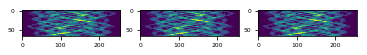

./data/doga_grams/rmeta/48_352_0.125.npy
./data/doga_grams/rmeta/33_512_0.125.npy


In [17]:
def grams():
    np.random.seed(0)
    pool=None
    for gap in gap_fractions:
        for num_steps in num_stepss:
            angle = total_measures // num_steps
            file = './data/doga_grams/rmeta/{}_{}_{}.npy'.format(angle, num_steps, gap)
            if not os.path.exists(file):
                print(file)
                procedure_raster = raster_scan(angle, num_steps, width_fraction=gap)
                procedure_meta = raster_scan(angle, num_steps, width_fraction=gap, nmeta=0, random=False)
                procedure_rmeta = raster_scan(angle, num_steps, width_fraction=gap, nmeta=0, random=True)

                chunk = int(angle)
                gram_raster, prb0 = calculate_gram(procedure_raster, angle*num_steps, phantom, pool=pool, chunksize=chunk)
                gram_meta, prb1  = calculate_gram(procedure_meta, angle*num_steps, phantom, pool=pool, chunksize=chunk)
                gram_rmeta, prb2 = calculate_gram(procedure_rmeta, angle*num_steps, phantom, pool=pool, chunksize=chunk)

                gram_raster = -np.log(gram_raster)
                gram_meta = -np.log(gram_meta)
                gram_rmeta = -np.log(gram_rmeta)

                np.save('./data/doga_grams/raster/{}_{}_{}.npy'.format(angle, num_steps, gap), [gram_raster, prb0])
                np.save('./data/doga_grams/meta/{}_{}_{}.npy'.format(angle, num_steps, gap), [gram_meta, prb1])
                np.save('./data/doga_grams/rmeta/{}_{}_{}.npy'.format(angle, num_steps, gap), [gram_rmeta, prb2])

                plt.figure()
                plt.subplot(1,3,1)
                plt.imshow(gram_raster.reshape(angle, num_steps))
                plt.subplot(1,3,2)
                plt.imshow(gram_meta.reshape(angle, num_steps))
                plt.subplot(1,3,3)
                plt.imshow(gram_rmeta.reshape(angle, num_steps))
                plt.show()
    
#                 print(gram_raster)
                
grams()
# textmewhendone('Fi', '8156440572', 'daniel.j.ching@gmail.com', 'xdvspvcaynshkmwu', grams)

In [ ]:
def plot_grams():
    np.random.seed(0)
    pool=None
    for gap in gap_fractions:
        for num_steps in num_stepss:
            angle = total_measures // num_steps

            gram_raster, prb0 = np.load('./data/doga_grams/raster/{}_{}_{}.npy'.format(angle, num_steps, gap))
            gram_meta, prb1 = np.load('./data/doga_grams/meta/{}_{}_{}.npy'.format(angle, num_steps, gap))
            gram_rmeta, prb2 = np.load('./data/doga_grams/rmeta/{}_{}_{}.npy'.format(angle, num_steps, gap))

#             fig = plt.figure(figsize=(3 * 8.85/2.54, 8.85/2.54), dpi=400)
            plt.figure()
            plt.subplot(1,3,1)
            plt.imshow(gram_raster.reshape(angle, num_steps), interpolation='none')
            plt.subplot(1,3,2)
            plt.imshow(gram_meta.reshape(angle, num_steps), interpolation='none')
            plt.subplot(1,3,3)
            plt.imshow(gram_rmeta.reshape(angle, num_steps), interpolation='none')
            plt.suptitle("Grams for {} measures and {} steps".format(total_measures, num_steps))
            plt.show()

# plot_grams()

./data/doga_recons/rmeta/50/512_1056_16_0.125.npy
[          ] 0.00%

/home/beams0/B242827/Documents/xdesign/xdesign/algorithms.py:227: RuntimeWarning: invalid value encountered in true_divide
  init += np.true_divide(update, sumdist * sy)


[##########] 100.00%
[##########] 100.00%
[##########] 100.00%
False


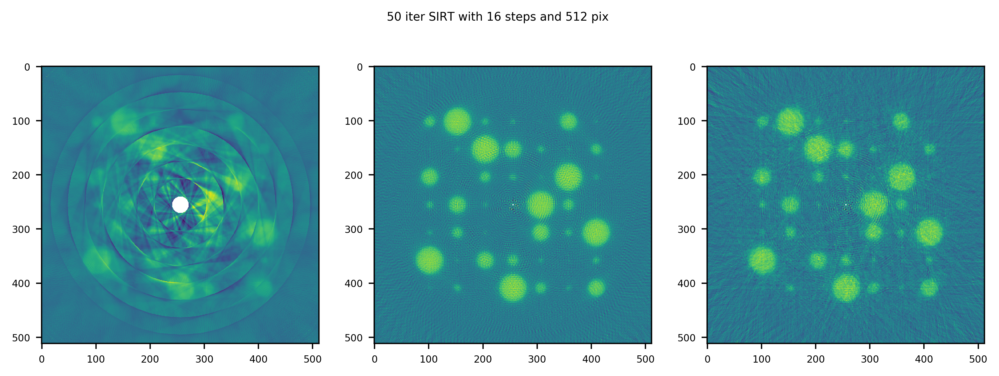

./data/doga_recons/rmeta/50/512_132_128_0.125.npy
[##########] 100.00%
[##########] 100.00%
[##########] 100.00%
False


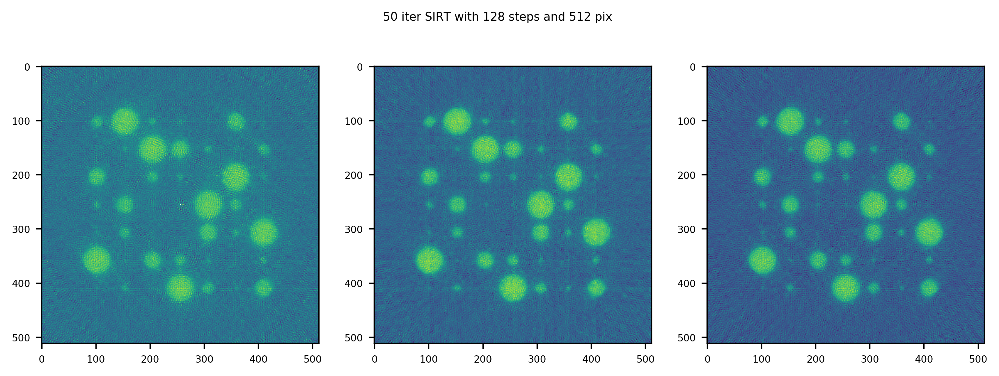

./data/doga_recons/rmeta/50/512_33_512_0.125.npy
[##########] 100.00%
[##########] 100.00%
[##########] 100.00%
False


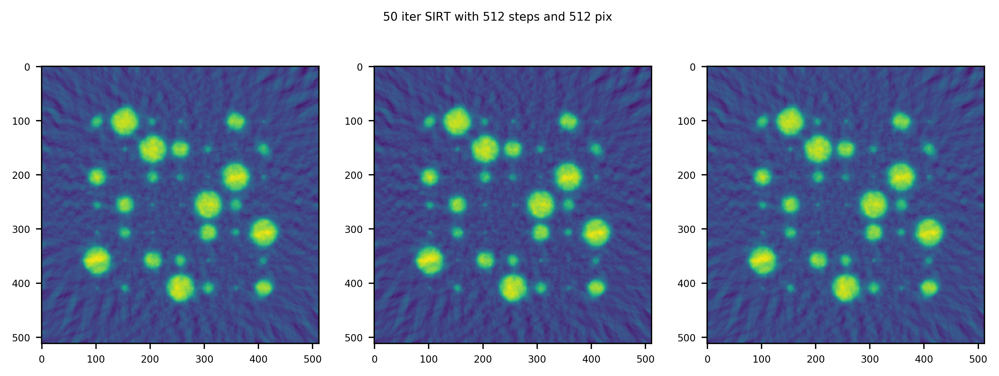

Successfully sent the SMS


In [37]:
def makeit(directory):
    if not os.path.exists(directory):
        os.makedirs(directory)

niter = 50

def recons():
    np.random.seed(0)
    pool=None
    for gap in gap_fractions:
        for num_steps in num_stepss:
            angle = total_measures // num_steps
            file = './data/doga_recons/rmeta/{}/{}_{}_{}_{}.npy'.format(niter, size, angle, num_steps, gap)
            if not os.path.exists(file):
                print(file)
                gram_raster, prb0 = np.load('./data/doga_grams/raster/{}_{}_{}.npy'.format(angle, num_steps, gap))
                gram_meta, prb1 = np.load('./data/doga_grams/meta/{}_{}_{}.npy'.format(angle, num_steps, gap))
                gram_rmeta, prb2 = np.load('./data/doga_grams/rmeta/{}_{}_{}.npy'.format(angle, num_steps, gap))

#                 rec0 = np.load('./data/doga_recons/raster/{}_{}_{}.npy'.format(angle, num_steps, gap))
#                 rec1 = np.load('./data/doga_recons/meta/{}_{}_{}.npy'.format(angle, num_steps, gap))
#                 rec2 = np.load('./data/doga_recons/rmeta/{}_{}_{}.npy'.format(angle, num_steps, gap))

                rec0 = np.zeros((size, size))
                rec1 = np.zeros((size, size))
                rec2 = np.zeros((size, size))

                rec0 = sirt(prb0, gram_raster, rec0, niter=niter)
                rec1 = sirt(prb1, gram_meta, rec1, niter=niter)
                rec2 = sirt(prb2, gram_rmeta, rec2, niter=niter)

                makeit('./data/doga_recons/raster/{}'.format(niter))
                makeit('./data/doga_recons/meta/{}'.format(niter))
                makeit('./data/doga_recons/rmeta/{}'.format(niter))

                
                np.save('./data/doga_recons/raster/{}/{}_{}_{}_{}.npy'.format(niter, size, angle, num_steps, gap), rec0)
                np.save('./data/doga_recons/meta/{}/{}_{}_{}_{}.npy'.format(niter, size, angle, num_steps, gap), rec1)
                np.save('./data/doga_recons/rmeta/{}/{}_{}_{}_{}.npy'.format(niter, size, angle, num_steps, gap), rec2)

                print(np.all(rec0 == rec1))

                fig = plt.figure(figsize=(3 * 8.85/2.54, 8.85/2.54), dpi=400)
                plt.subplot(1,3,1)
                plt.imshow(rec0)
                plt.subplot(1,3,2)
                plt.imshow(rec1)
                plt.subplot(1,3,3)
                plt.imshow(rec2)
                plt.suptitle("{} iter SIRT with {} steps and {} pix".format(niter, num_steps, size))

#                 plt.savefig('./figures/{}_recon_comparison_{}.png'.format(angle, niter), format='png',
#                 transparent=True, bbox_inches=None, pad_inches=0,
#                 frameon=False)

                plt.show()

# recons()
textmewhendone('Fi', '8156440572', 'daniel.j.ching@gmail.com', 'xdvspvcaynshkmwu', recons)

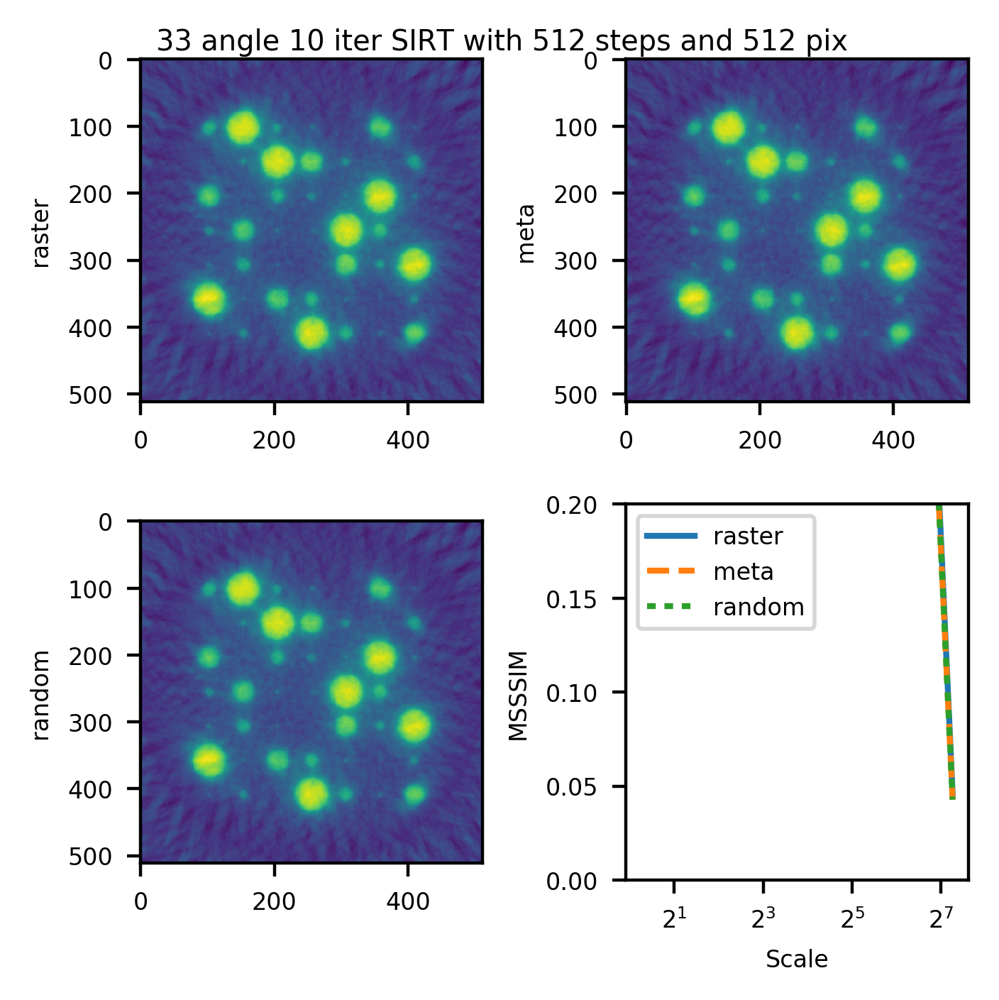

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


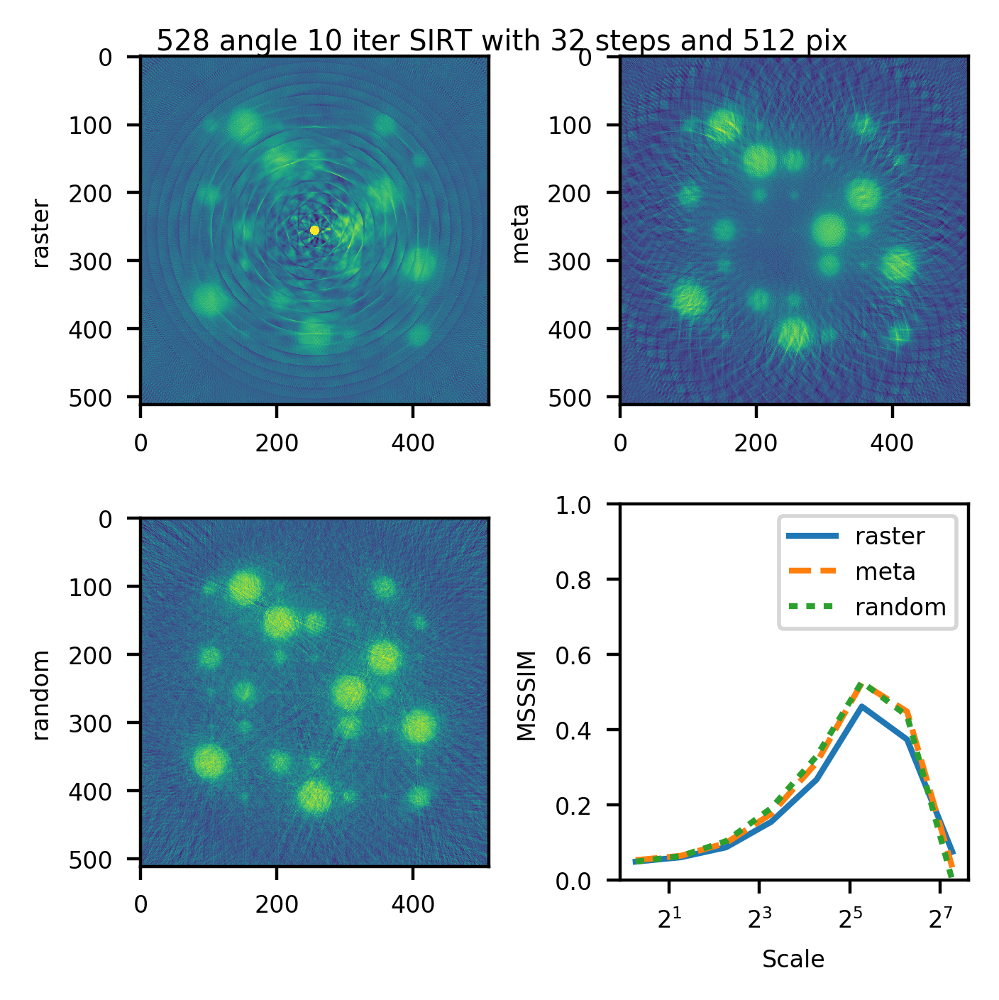

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


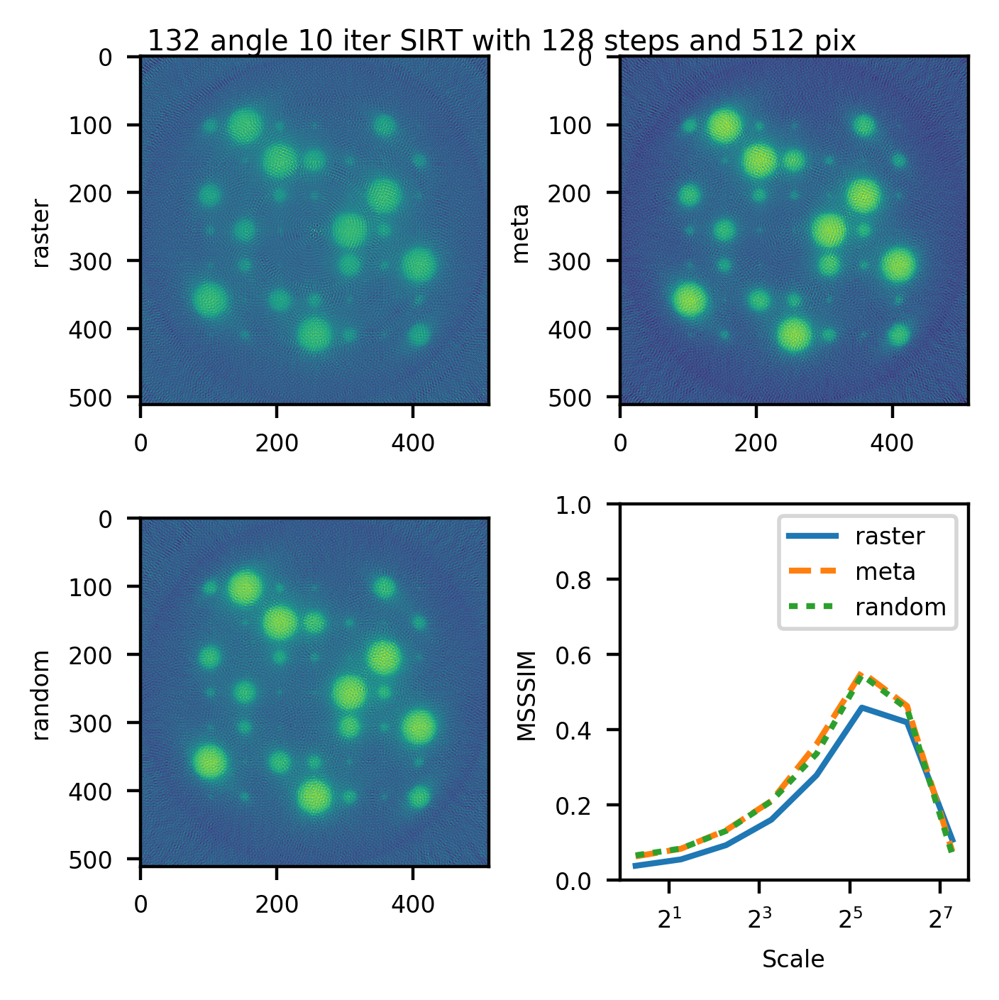

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


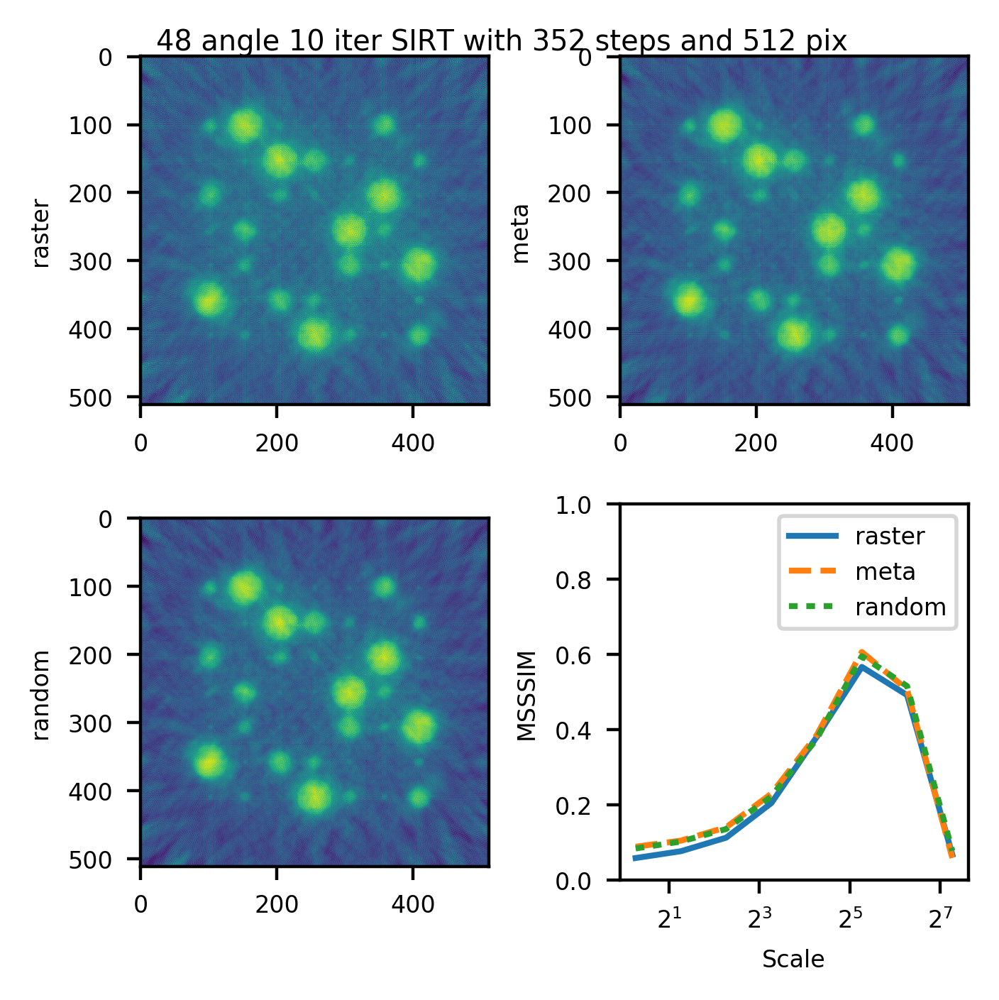

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.


In [28]:
niter=10
import tifffile as tif
import matplotlib
matplotlib.rcParams.update({'font.size': 6})

def plot_recons():
    for gap in gap_fractions:
        for num_steps in num_stepss:
            angle = total_measures // num_steps
            ending = '{}/{}_{}_{}_{}'.format(niter, size, angle, num_steps, gap)
            rec0 = np.load('./data/doga_recons/raster/' + ending + '.npy')
            rec1 = np.load('./data/doga_recons/meta/{}/{}_{}_{}_{}.npy'.format(niter, size, angle, num_steps, gap))
            rec2 = np.load('./data/doga_recons/rmeta/{}/{}_{}_{}_{}.npy'.format(niter, size, angle, num_steps, gap))
            
            # filter out nans
            rec0[np.isnan(rec0)] = 1
            rec1[np.isnan(rec1)] = 1
            rec2[np.isnan(rec2)] = 1
            
            # Save tiff files
            tif.imsave('./data/doga_recons/raster/' + ending + '.tiff', rec0.astype('float32'))
            tif.imsave('./data/doga_recons/meta/' + ending + '.tiff', rec1.astype('float32'))
            tif.imsave('./data/doga_recons/rmeta/' + ending + '.tiff', rec2.astype('float32'))

            fig = plt.figure(figsize=(8.85/2.54, 8.85/2.54), dpi=400)
#             plt.figure(dpi=400)
            plt.subplot(2,2,1)
            plt.imshow(rec0, interpolation=None)
            plt.ylabel('raster')
            plt.subplot(2,2,2)
            plt.imshow(rec1, interpolation=None)
            plt.ylabel('meta')
            plt.subplot(2,2,3)
            plt.imshow(rec2, interpolation=None)
            plt.ylabel('random')

            plt.subplot(2,2,4)
            nlev=8
            method = 'MSSSIM'
            iq0 = ImageQuality(truth, rec0.T)
            iq0.compute_quality(nlevels=nlev, method=method)
            plt.plot(iq0.scales, iq0.mets)
            iq = ImageQuality(truth, rec1.T)
            iq.compute_quality(nlevels=nlev, method=method)
            plt.plot(iq.scales, iq.mets, linestyle='--')
            iq = ImageQuality(truth, rec2.T)
            iq.compute_quality(nlevels=nlev, method=method)
            plt.plot(iq.scales, iq.mets, linestyle=':')
#                 plt.xlim([2**4, 2**7])
            plt.ylim([0.0, 1.0])

            plt.gca().set_xscale('log', basex=2)
#                 plt.gca().set_yscale('log', basey=10)
#                     plt.title("Quality at {} angles {} steps {} size".format(angle, num_steps, size))
            plt.ylabel(method)
            plt.xlabel('Scale')
            plt.legend(['raster', 'meta', 'random'])

            plt.suptitle("{} angle {} iter SIRT with {} steps and {} pix".format(angle, niter, num_steps, size))
            
            plt.tight_layout()

            plt.savefig('./figures/balanced/{}_{}_recon_comparison_{}_{}.png'.format(angle, niter, num_steps, size), format='png',
            transparent=False, bbox_inches=None, pad_inches=0,
            frameon=False)
            
#             plt.figure()
#             plot_metrics(iq0)


            plt.show()
plot_recons()

In [ ]:
def metrics():
    np.random.seed(0)
    pool=None
    for angle in projection_angles:
        for gap in gap_fractions:
            for num_steps in num_stepss:

                niter = 10
                rec0 = np.load('./data/doga_recons/raster/{}/{}_{}_{}_{}.npy'.format(niter, size, angle, num_steps, gap))
                rec1 = np.load('./data/doga_recons/meta/{}/{}_{}_{}_{}.npy'.format(niter, size, angle, num_steps, gap))
                rec2 = np.load('./data/doga_recons/rmeta/{}/{}_{}_{}_{}.npy'.format(niter, size, angle, num_steps, gap))

                nlev=8
                iq = ImageQuality(truth, rec0.T)
                iq.compute_quality(nlevels=nlev)
                plt.plot(iq.scales, iq.mets)
                iq = ImageQuality(truth, rec1.T)
                iq.compute_quality(nlevels=nlev)
                plt.plot(iq.scales, iq.mets)
                iq = ImageQuality(truth, rec2.T)
                iq.compute_quality(nlevels=nlev)
                plt.plot(iq.scales, iq.mets)
#                 plt.xlim([2**4, 2**7])
#                 plt.ylim([0.02, 0.1])

                plt.gca().set_xscale('log', basex=2)
#                 plt.gca().set_yscale('log', basey=10)
                plt.title("Quality at {} angles {} steps {} size".format(angle, num_steps, size))
                plt.ylabel('MS-SSIM')
                plt.xlabel('Scale')
                plt.legend(['raster', 'meta', 'rmeta'])
                
                plt.savefig('./figures/{}_metrics_comparison.png'.format(angle), format='png',
                transparent=True, bbox_inches=None, pad_inches=0,
                frameon=False)
                plt.show()
                
# metrics()